                                      ~ D22012 - BHARATH BOMMEESHWAR K ~ 

### <U> Problem Statement 
<font color= green> You are hired by a company Gem Stones co ltd, which is a cubic zirconia 
manufacturer. You are provided with the dataset containing the prices and other 
attributes of almost 27,000 cubic zirconia (which is an inexpensive diamond 
alternative with many of the same qualities as a diamond). The company is earning 
different profits on different prize slots. You have to help the company in predicting 
the price for the stone on the bases of the details given in the dataset so it can 
distinguish between higher profitable stones and lower profitable stones so as to 
have better profit share. Also, provide them with the best 5 attributes that are most 
important.

### <U>Objective

To build a optimal Machine learning model for predicting the price of the gemstone. Thereby it would help to improve the business profitability.

### <U>Frame work
   - Data acquistion
   - Exploratory Data Analysis - Univariate and bivariate
   - Data pre-processing 
   - Building machine learning model and evaluating 
   - Model testing
   - Checking Assumptions of Linear Regression 
   - Recommendations
   - Prediction using other models 
   - Conclusion  


# <font color= blue>.................................................................................................................................

## 1. DATA ACQUISITION

####  IMPORTING LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import time

from scipy import stats
import statsmodels.formula.api as sm

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

from sklearn import metrics 

from sklearn.impute import KNNImputer

In [2]:
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan,het_goldfeldquandt
from statsmodels.stats.outliers_influence import variance_inflation_factor,reset_ramsey

#### READING THE FILE

In [3]:
#Importing the cubic_zirconia dataset and making copy of original dataset. Removed the column index
data=pd.read_csv('Gem_prices.csv')

In [4]:
data.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,price
0,1,0.30,Ideal,E,SI1,62.1,58.0,4.27,4.29,2.66,499
1,2,0.33,Premium,G,IF,60.8,58.0,4.42,4.46,2.70,984
2,3,0.90,Very Good,E,VVS2,62.2,60.0,6.04,6.12,3.78,6289
3,4,0.42,Ideal,F,VS1,61.6,56.0,4.82,4.80,2.96,1082
4,5,0.31,Ideal,F,VVS1,60.4,59.0,4.35,4.43,2.65,779


In [5]:
#dropping serial number column
data.drop(['Unnamed: 0'],axis=1,inplace=True)

In [6]:
#making copy of original data set
gem = data.copy()

#### INFORMATION ABOUT THE DATASET

In [7]:
gem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26967 entries, 0 to 26966
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    26967 non-null  float64
 1   cut      26967 non-null  object 
 2   color    26967 non-null  object 
 3   clarity  26967 non-null  object 
 4   depth    26270 non-null  float64
 5   table    26967 non-null  float64
 6   x        26967 non-null  float64
 7   y        26967 non-null  float64
 8   z        26967 non-null  float64
 9   price    26967 non-null  int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 2.1+ MB


| Variable      | Description                                                                                                 |
| ------------- | ----------------------------------------------------------------------------------------------------------- |
| Carat         | Carat weight of the cubic zirconia    |                                                                       
| Cut           | Describe the cut quality of the cubic zirconia. Quality is increasing order Fair, Good,VeryGood,Premium,Ideal                                                                                                        |
| Color         | Colour of the cubic zirconia.With D being the best and J the worst                                          |
| Clarity      | cubic zirconia Clarity refers to the absence of the Inclusions and Blemishes. (In order from Best to Worst, FL = 1. flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3                                     |                                                                                  
| X        | Length of the cubic zirconia in mm                                                                               |
| Y    | Width of the cubic zirconia in mm                                                                                    |
| Z          | Height of the cubic zirconia in mm                                                                             | 
| Depth     |The Height of a cubic zirconia, measured from the Culet to the table, divided by its average Girdle Diameter     |  
| Table     | The Width of the cubic zirconias Table expressed as a Percentage of its Average Diameter                        |  
| Price   | the Price of the cubic zirconia                                                                                   | 
                                                           


### <u>The dataset contains totally 10 variables and 26967 observations
  - 7 Numerical variables - The dataset contains 6 float datatype variables and 1 integer datatype variable  
  - 3 Categorical variables - The dataset contains 3 object datatype variables  
  - 1 target variable(numerical)  


# <font color= blue>.................................................................................................................................

## 2.EXPLORATORY DATA ANALYSIS

In [8]:
# Identifying the presence of null values
gem.isnull().sum()

carat        0
cut          0
color        0
clarity      0
depth      697
table        0
x            0
y            0
z            0
price        0
dtype: int64

In [9]:
# Checking for any duplicate entries
duplicates=gem.duplicated()
print("Duplicates count:",duplicates.sum())
gem[duplicates]

Duplicates count: 34


,carat,cut,color,clarity,depth,table,x,y,z,price
4756,0.35,Premium,J,VS1,62.4,58.0,5.67,5.64,3.53,949
6215,0.71,Good,F,SI2,64.1,60.0,0.00,0.00,0.00,2130
8144,0.33,Ideal,G,VS1,62.1,55.0,4.46,4.43,2.76,854
8919,1.52,Good,E,I1,57.3,58.0,7.53,7.42,4.28,3105
9818,0.35,Ideal,F,VS2,61.4,54.0,4.58,4.54,2.80,906
10473,0.79,Ideal,G,SI1,62.3,57.0,5.90,5.85,3.66,2898
10500,1.00,Premium,F,VVS2,60.6,54.0,6.56,6.52,3.96,8924
12894,1.21,Premium,D,SI2,62.5,57.0,6.79,6.71,4.22,6505
13547,0.43,Ideal,G,VS1,61.9,55.0,4.84,4.86,3.00,943
13783,0.79,Ideal,G,SI1,62.3,57.0,5.90,5.85,3.66,2898


In [10]:
# Dropping the duplicates
gem.drop_duplicates(inplace=True)

duplicates=gem.duplicated()
print("Duplicates count:",duplicates.sum())
gem[duplicates]

Duplicates count: 0


,carat,cut,color,clarity,depth,table,x,y,z,price


##### No duplicates are found and if any present they should be removed.

In [11]:
# Descriptive statistics of all the 7 numerical variables
gem.describe()

,carat,depth,table,x,y,z,price
count,26933.000000,26236.000000,26933.000000,26933.000000,26933.000000,26933.000000,26933.000000
mean,0.798010,61.745285,57.455950,5.729346,5.733102,3.537769,3937.526120
std,0.477237,1.412243,2.232156,1.127367,1.165037,0.719964,4022.551862
min,0.200000,50.800000,49.000000,0.000000,0.000000,0.000000,326.000000
25%,0.400000,61.000000,56.000000,4.710000,4.710000,2.900000,945.000000
50%,0.700000,61.800000,57.000000,5.690000,5.700000,3.520000,2375.000000
75%,1.050000,62.500000,59.000000,6.550000,6.540000,4.040000,5356.000000
max,4.500000,73.600000,79.000000,10.230000,58.900000,31.800000,18818.000000


#####  From the descriptive statistics, its clearly visible that mean for most of the variables differ from the median i.e. skewed data  and 50% of the gems price fall below 2375 INR  

In [12]:
# Descriptive statistics of all the 3 categorical variables
gem.describe(include="all")

,carat,cut,color,clarity,depth,table,x,y,z,price
count,26933.000000,26933,26933,26933,26236.000000,26933.000000,26933.000000,26933.000000,26933.000000,26933.000000
unique,NaN,5,7,8,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Ideal,G,SI1,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,10805,5653,6565,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.798010,NaN,NaN,NaN,61.745285,57.455950,5.729346,5.733102,3.537769,3937.526120
std,0.477237,NaN,NaN,NaN,1.412243,2.232156,1.127367,1.165037,0.719964,4022.551862
min,0.200000,NaN,NaN,NaN,50.800000,49.000000,0.000000,0.000000,0.000000,326.000000
25%,0.400000,NaN,NaN,NaN,61.000000,56.000000,4.710000,4.710000,2.900000,945.000000
50%,0.700000,NaN,NaN,NaN,61.800000,57.000000,5.690000,5.700000,3.520000,2375.000000
75%,1.050000,NaN,NaN,NaN,62.500000,59.000000,6.550000,6.540000,4.040000,5356.000000


# Univariate analysis

#### <I> NUMERICAL VARIABLES

Text(0.5, 1.0, 'Box Plot of price Distribution')

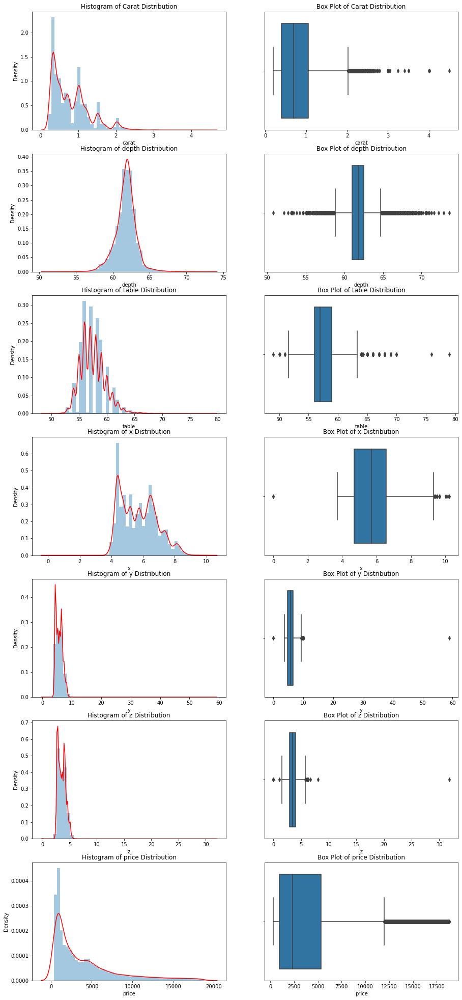

In [13]:
fig,axes=plt.subplots(nrows=7,ncols=2)
fig.set_size_inches(15,35)

# Carat

carat=sns.distplot(gem['carat'], ax=axes[0][0], kde_kws={"color": "r"})
carat.set_title('Histogram of Carat Distribution')
carat=sns.boxplot(gem['carat'], ax=axes[0][1])
carat.set_title('Box Plot of Carat Distribution')

# depth

depth=sns.distplot(gem['depth'], ax=axes[1][0], kde_kws={"color": "r"})
depth.set_title('Histogram of depth Distribution')
depth=sns.boxplot(gem['depth'], ax=axes[1][1])
depth.set_title('Box Plot of depth Distribution')

# table

table=sns.distplot(gem['table'], ax=axes[2][0], kde_kws={"color": "r"})
table.set_title('Histogram of table Distribution')
table=sns.boxplot(gem['table'], ax=axes[2][1])
table.set_title('Box Plot of table Distribution')

# x

x=sns.distplot(gem['x'], ax=axes[3][0], kde_kws={"color": "r"})
x.set_title('Histogram of x Distribution')
x=sns.boxplot(gem['x'], ax=axes[3][1])
x.set_title('Box Plot of x Distribution')

# y

y=sns.distplot(gem['y'], ax=axes[4][0], kde_kws={"color": "r"})
y.set_title('Histogram of y Distribution')
y=sns.boxplot(gem['y'], ax=axes[4][1])
y.set_title('Box Plot of y Distribution')

# z

z=sns.distplot(gem['z'], ax=axes[5][0], kde_kws={"color": "r"})
z.set_title('Histogram of z Distribution')
z=sns.boxplot(gem['z'], ax=axes[5][1])
z.set_title('Box Plot of z Distribution')

# price

price=sns.distplot(gem['price'], ax=axes[6][0], kde_kws={"color": "r"})
price.set_title('Histogram of price Distribution')
price=sns.boxplot(gem['price'], ax=axes[6][1])
price.set_title('Box Plot of price Distribution')

#### INSIGHTS :
* <b><i>Under our analysis among all the variables, variable 'depth' has got the normally distributed curve, other variables    have got the skewed distribution  
* <b><i>Outliers are seen in almost all the variables since they might be influential they are retained for now.After seeing the performance of the model they will be dealt upon later.   

### <I> CATEGORICAL VARIABLES

#### Variable - "Cut"

In [14]:
#Frequency plots to see the counts
cut_table=pd.crosstab(gem.cut,columns="Frequency")
cut_table

col_0,Frequency
cut,
Fair,780
Good,2435
Ideal,10805
Premium,6886
Very Good,6027


In [15]:
#In percentage total
cut_coltotal=cut_table.sum(axis=0)
cut_table.div(cut_coltotal,axis=1)*100

col_0,Frequency
cut,
Fair,2.896075
Good,9.040953
Ideal,40.118071
Premium,25.567148
Very Good,22.377752


<AxesSubplot:xlabel='cut', ylabel='count'>

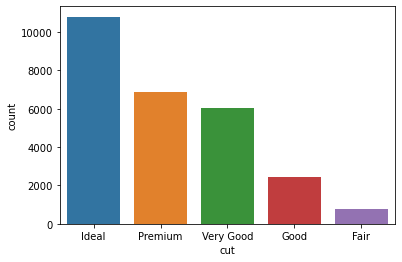

In [16]:
sns.countplot(gem['cut'],order=gem['cut'].value_counts().index)

#### Variable - "Color"

In [17]:
color_table=pd.crosstab(gem.color,columns="Frequency")
color_table

col_0,Frequency
color,
D,3341
E,4916
F,4723
G,5653
H,4095
I,2765
J,1440


In [18]:
color_coltotal=color_table.sum(axis=0)
color_table.div(color_coltotal,axis=1)*100

col_0,Frequency
color,
D,12.404856
E,18.252701
F,17.536108
G,20.989121
H,15.204396
I,10.266216
J,5.346601


<AxesSubplot:xlabel='color', ylabel='count'>

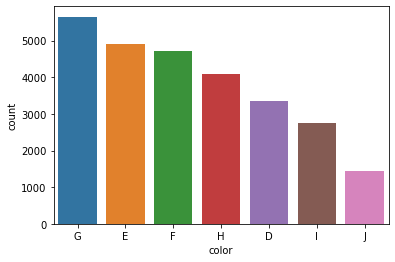

In [19]:
sns.countplot(gem['color'],order=gem['color'].value_counts().index)

#### Variable - "Clarity"

In [20]:
clarity_table=pd.crosstab(gem.clarity,columns="Frequency")
clarity_table

col_0,Frequency
clarity,
I1,364
IF,891
SI1,6565
SI2,4564
VS1,4087
VS2,6093
VVS1,1839
VVS2,2530


In [21]:
clarity_coltotal=clarity_table.sum(axis=0)
clarity_table.div(clarity_coltotal,axis=1)*100

col_0,Frequency
clarity,
I1,1.351502
IF,3.308209
SI1,24.375302
SI2,16.945754
VS1,15.174693
VS2,22.622805
VVS1,6.828055
VVS2,9.393681


<AxesSubplot:xlabel='clarity', ylabel='count'>

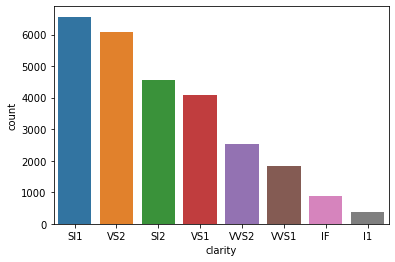

In [22]:
sns.countplot(gem['clarity'],order = gem['clarity'].value_counts().index)

#### INSIGHTS:
* <b><i> Under our analysis, nearly 25 % of the gems have SI1 clarity whereas only 1 % of the gems have I1 clarity
* <b><i> Under our analysis, 40% of the gems have ideal cuts whereas only 3 % of the gems have fair cuts 
* <b><i> Under our analysis, around 21 % of the gems have color 'G' whereas around 5 % of the gems have color 'J'

# Bivariate analysis

#### <I> NUMERICAL VARIABLES

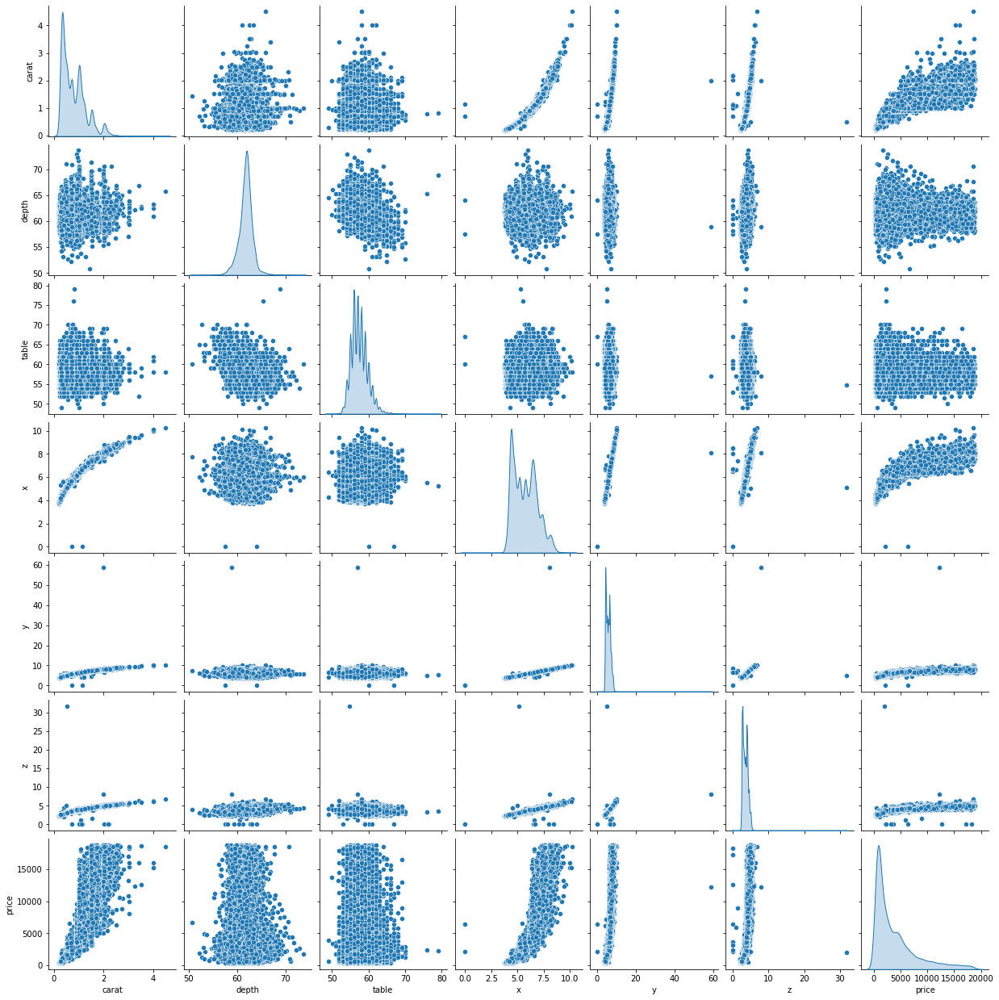

In [23]:
# Pairplot to see the linear relationship between variables
sns.pairplot(gem,diag_kind='kde')

* <b><i>Under our analysis, from the pairplot it can be clearly seen that the price of gems lineraly increasing with the increase in carat weight  
* <b><i>Also the dimensions of gems (x-length,y-breadth,z-height) have also got the linear relationship on the price. As the size of the gem varies, the price is also getting affected 

In [24]:
# Correlation between the numerical variables
gem.corr()

,carat,depth,table,x,y,z,price
carat,1.000000,0.035240,0.181539,0.976858,0.941442,0.940982,0.922409
depth,0.035240,1.000000,-0.297768,-0.018401,-0.024453,0.101973,-0.002895
table,0.181539,-0.297768,1.000000,0.196254,0.182352,0.148994,0.126844
x,0.976858,-0.018401,0.196254,1.000000,0.962601,0.956490,0.886554
y,0.941442,-0.024453,0.182352,0.962601,1.000000,0.928725,0.856441
z,0.940982,0.101973,0.148994,0.956490,0.928725,1.000000,0.850682
price,0.922409,-0.002895,0.126844,0.886554,0.856441,0.850682,1.000000


In [25]:
#Check Correlation with Price
gem.corr().price

carat    0.922409
depth   -0.002895
table    0.126844
x        0.886554
y        0.856441
z        0.850682
price    1.000000
Name: price, dtype: float64

#### INSIGHTS:
* <b><I> Variable carat has got the highest positive correlation with x, y, z and price
* <b><I> Variable price has got the second highest positive correlation with carat, x, y and z
* <b><I> Variables depth and table have got the least positive correlation / negative correlation with other variables
* <b><I> Especially, variable depth is negatively correlated with almost all the variables 

### <I> CATEGORICAL VARIABLES

In [26]:
gem.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z',
       'price'],
      dtype='object')

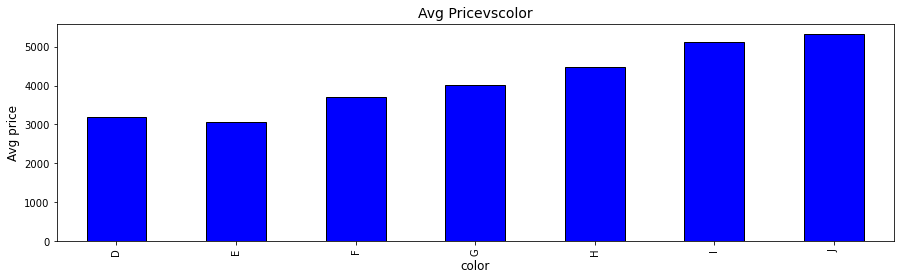

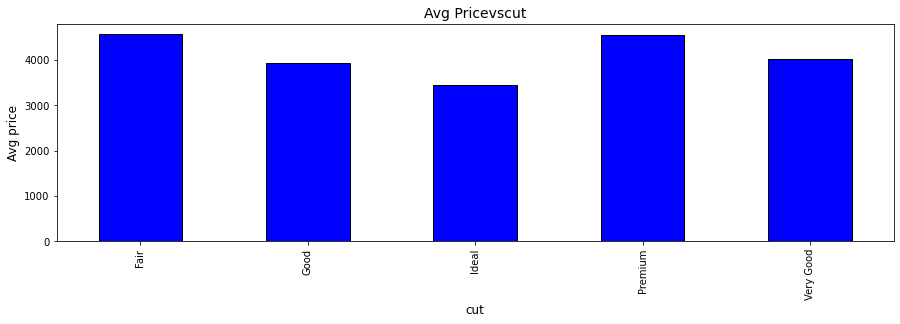

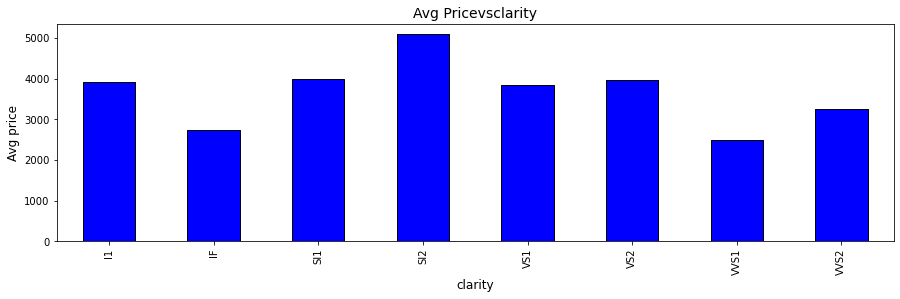

In [27]:

# Groupby aggregate using barplot 

cat_disc = ['color', 'cut', 'clarity']

for i in cat_disc:    
    gem.groupby([i])['price'].mean().plot(kind='bar',figsize=(15,4),color="blue",fontsize=10,edgecolor="black")
    plt.xlabel(i,fontsize=12)
    plt.ylabel('Avg price',fontsize=12)
    plt.title('Avg Price'+ 'vs'+i ,fontsize=14)
    plt.show()

#### INSIGHTS:
* <b><I> Color of the stone shows correlation with price("D" least priced to "J" high priced)  
* <b><I> The price doesnot differ much with respect to every individual cuts.  
* <b><I> Average Price of S12 clarity is higher compared to other clarity stones.  



# <font color= blue>.................................................................................................................................

## 3.DATA PRE-PROCESSING

#### <I> NULL VALUE IMPUTATION

In [28]:
#Rectifying the null values for input the data in model for training
gem.isnull().sum()

carat        0
cut          0
color        0
clarity      0
depth      697
table        0
x            0
y            0
z            0
price        0
dtype: int64

* <b> Here the variable 'depth' has got 697  (around 2.5 % of the data- its meaningless to drop) null values which needs to be imputed with the mean since the variable is normally distributed 

In [29]:
# Assigning mean values to all the nulls of variable depth(continuous)
depth_mean=gem['depth'].mean()
gem['depth']=gem['depth'].fillna(value=depth_mean)

In [30]:
#KNN imputer can also be used but due to time complexity we go with mean imputation which is appropriate in this case
#imputer = KNNImputer(n_neighbors = 10)
#imputer.fit_transform(df)

In [31]:
# After imputation, checking for any null values
gem.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
x          0
y          0
z          0
price      0
dtype: int64

#### <I> CHECKING FOR ZERO VALUES IN THE DATASET

In [32]:
for variable in gem.columns: 
    print("\nVariable: ",variable)
    print(gem.loc[gem[variable]==0])


Variable:  carat
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

Variable:  cut
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

Variable:  color
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

Variable:  clarity
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

Variable:  depth
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

Variable:  table
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

Variable:  x
       carat   cut color clarity  depth  table    x    y    z  price
5821    0.71  Good     F     SI2   64.1   60.0  0.0  0.0  0.0   2130
17506   1.14  Fair     G     VS1   57.5   67.0  0.0  0.0  0.0   6381

Variable:  y
       carat   cut color clarity  depth  table    x    y    z  price
5821    0.71  Good     F

* <b> Variables x, y and z which are dimensions have got few 0 value records. Since zero values are meaningless in dimension of an item they need to be imputed 
* <b> 0's are imputed with median values since x, y and z data distribution is skewed

In [33]:
#Imputing with median
gem['x']=gem['x'].replace(0,gem['x'].median())
gem['y']=gem['y'].replace(0,gem['y'].median())
gem['z']=gem['z'].replace(0,gem['z'].median())

In [34]:
# Rechecking for zero values after imputation
for varaible in gem.columns:
    print("\n Variable:",variable)
    print(gem.loc[gem[variable]==0])


 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
Index: []

 Variable: price
Empty DataFrame
Columns: [carat, cut, color, clarity, depth, table, x, y, z, price]
In

In [35]:
#Making of a copy of dataset before encoding
gem1 = gem.copy()

#### <I> ENCODING CATEGORICAL VARIABLES
Since Algorithms cannot deal with strings ther are converted to numerics    

In [36]:
gem1=pd.get_dummies(gem1,columns=['cut', 'color', 'clarity'],drop_first=True)
gem1             # cut_fair,color_D,clarity_I1 are the references,so we drop those in dummies

,carat,depth,table,x,y,z,price,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,0.30,62.1,58.0,4.27,4.29,2.66,499,0,1,0,...,0,0,0,0,1,0,0,0,0,0
1,0.33,60.8,58.0,4.42,4.46,2.70,984,0,0,1,...,0,0,0,1,0,0,0,0,0,0
2,0.90,62.2,60.0,6.04,6.12,3.78,6289,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0.42,61.6,56.0,4.82,4.80,2.96,1082,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,0.31,60.4,59.0,4.35,4.43,2.65,779,0,1,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26962,1.11,62.3,58.0,6.61,6.52,4.09,5408,0,0,1,...,0,0,0,0,1,0,0,0,0,0
26963,0.33,61.9,55.0,4.44,4.42,2.74,1114,0,1,0,...,1,0,0,1,0,0,0,0,0,0
26964,0.51,61.7,58.0,5.12,5.15,3.17,1656,0,0,1,...,0,0,0,0,0,0,0,1,0,0
26965,0.27,61.8,56.0,4.19,4.20,2.60,682,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [37]:
gem2 = gem1.copy()
gem3 = gem1.copy()
gem2

,carat,depth,table,x,y,z,price,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,0.30,62.1,58.0,4.27,4.29,2.66,499,0,1,0,...,0,0,0,0,1,0,0,0,0,0
1,0.33,60.8,58.0,4.42,4.46,2.70,984,0,0,1,...,0,0,0,1,0,0,0,0,0,0
2,0.90,62.2,60.0,6.04,6.12,3.78,6289,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0.42,61.6,56.0,4.82,4.80,2.96,1082,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,0.31,60.4,59.0,4.35,4.43,2.65,779,0,1,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26962,1.11,62.3,58.0,6.61,6.52,4.09,5408,0,0,1,...,0,0,0,0,1,0,0,0,0,0
26963,0.33,61.9,55.0,4.44,4.42,2.74,1114,0,1,0,...,1,0,0,1,0,0,0,0,0,0
26964,0.51,61.7,58.0,5.12,5.15,3.17,1656,0,0,1,...,0,0,0,0,0,0,0,1,0,0
26965,0.27,61.8,56.0,4.19,4.20,2.60,682,0,0,0,...,0,0,0,0,0,0,0,0,0,1


#### <I>SPLITTING DATASET INTO TRAIN VALIDATION SPLIT

In [38]:
X=gem1.drop('price',axis=1)
y=gem1.pop('price')

In [39]:
from sklearn.model_selection import train_test_split

In [40]:
#Splitting into Train Test 70:30 ratio
#The test data kept under complete darkness for final testing of the model.
X_train_a,X_test_a,y_train_a,y_test_a=train_test_split(X,y,test_size=0.3,random_state=42)

In [41]:
#Whole data is splitted into Train and Test
print(X_train_a.shape)
print(y_train_a.shape)
print(X_test_a.shape)
print(y_test_a.shape)

(18853, 23)
(18853,)
(8080, 23)
(8080,)


In [42]:
#From the train data now we can split the validation data which can be used to validate the trained model over this data.
#Here we are again making 70:30 split,which is 30% of 70% which is 0.43
X_train_a,X_valid_a,y_train_a,y_valid_a = train_test_split(X_train_a,y_train_a,test_size=0.43,random_state=42) 

In [43]:
#Train data is splitted into Train and validation
print(X_train_a.shape)
print(y_train_a.shape)
print(X_valid_a.shape)
print(y_valid_a.shape)

(10746, 23)
(10746,)
(8107, 23)
(8107,)



# <font color= blue>.................................................................................................................................

## 4.BUILDING MACHINE LEARNING MODEL & EVALUATING

### NOTE:
*<font color= green> <b><i>From the EDA we could see the dependent variable has linear relationship with most of the independent variables so 
    we choose to use Linear Regression Model ,in addition we will try with other models such as KNN and Decision Tree

### <font color= BLUE> <b>(1). LINEAR REGRESSION

### <i> <u>TRIAL 1
* <b> <i> Include all variables

##### * Note: The model testing is done in each trials which can be avoided just by choosing one which performs well on the validation data.

##### <U>MODEL TRAINING

In [44]:
#Fitting the linear model to the train dataset for the model to get trained
reg1 = LinearRegression()
reg1.fit(X_train_a,y_train_a)

LinearRegression()

In [45]:
#Point of intercept of the Regression line over yaxis
reg1.intercept_

-957.1096002624608

In [46]:
#the regressors of each predictor variable  which determines the prediction
reg1.coef_

array([11613.54349152,   -17.30476626,   -13.48082367,  -714.89392914,
          36.94274132,  -779.80935947,   543.51494624,   888.51608385,
         741.64409769,   706.96715417,  -194.20796805,  -286.24452749,
        -502.73636795,  -982.47364358, -1552.24465618, -2419.06570506,
        5246.47996213,  3658.00314544,  2639.27924655,  4590.28678243,
        4276.85143359,  5017.1566809 ,  4925.20476647])

In [47]:
#Rsquare value gives the fitness of the model with data(proportion of explained error over total error in prediction)
T1_R2 = reg1.score(X_train_a,y_train_a)
T1_R2

0.9218502152100582

##### <U> MODEL VALIDATION

In [48]:
X_train_a.columns

Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'cut_Good', 'cut_Ideal',
       'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

In [49]:
#Using validation data to check the model performance over prediction
reg_pred1 = reg1.predict(X_valid_a)
reg_pred1

array([12930.32819959,  2868.08577613,  5864.86978343, ...,
         174.35811472,   496.26877471,  2348.00293102])

In [50]:
#MAE (mean absolute error)
T1_MAE = np.mean(np.abs(y_valid_a-reg_pred1))
T1_MAE

736.0084838886662

In [51]:
#MSE
T1_MSE = np.mean((y_valid_a -reg_pred1)**2)
T1_MSE

1265686.5170108841

In [52]:
#RMSE
T1_RMSE = np.sqrt(np.mean((y_valid_a-reg_pred1)**2))
T1_RMSE

1125.0273405615012

In [53]:
#MAPE
T1_MAPE = np.mean(np.abs(y_valid_a-reg_pred1)/y_valid_a)*100
T1_MAPE

40.14910743581456

###### <U><I>MODEL TESTING

In [54]:
#Testing with Trial1 model

In [55]:
#Using test data to check the model performance over prediction
reg_pred1 = reg1.predict(X_test_a)
reg_pred1

array([ 942.03245638,  -74.57815665, -813.28737521, ..., -356.12559815,
       6154.01471457,  434.75422675])

In [56]:
X_test_a

,carat,depth,table,x,y,z,cut_Good,cut_Ideal,cut_Premium,cut_Very Good,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
3916,0.41,61.8,59.0,4.76,4.72,2.93,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
10439,0.31,62.2,60.0,4.30,4.32,2.68,0,0,0,1,...,0,1,0,0,0,0,0,0,1,0
24237,0.41,61.7,55.0,4.79,4.81,2.96,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0
9590,0.27,58.6,61.0,4.27,4.30,2.51,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
7451,1.24,62.4,59.0,6.82,6.86,4.27,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19796,0.60,63.7,56.0,5.34,5.36,3.41,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
10346,0.45,57.6,62.5,5.05,5.09,2.91,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11273,0.43,61.8,57.0,4.88,4.83,3.00,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
21889,1.01,62.5,58.0,6.43,6.40,4.01,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


In [57]:
#MAE (mean absolute error)
T1_MAE_T = np.mean(np.abs(y_test_a-reg_pred1))
T1_MAE_T

747.3224221790449

In [58]:
#MSE
T1_MSE_T = np.mean((y_test_a -reg_pred1)**2)
T1_MSE_T

1354560.03095797

In [59]:
#RMSE
T1_RMSE_T = np.sqrt(np.mean((y_test_a-reg_pred1)**2))
T1_RMSE_T

1163.855674453654

In [60]:
#MAPE
T1_MAPE_T = np.mean(np.abs(y_test_a-reg_pred1)/y_test_a)*100
T1_MAPE_T

40.39298178935069

### <i> <u>TRIAL 2
* <b> <i> Log transformation of Target variable

In [61]:
#Log transformation bring down the scale/magnitude of the values.This is used when the range of values are high
y_train_tranf = y_train_a.copy()

In [62]:
#taking log of y
log_y = np.log(y_train_tranf)

In [63]:
#y_train
log_y

9526     7.693026
8391     9.549096
16806    8.621733
14842    7.920447
22637    8.963160
           ...   
14456    9.562053
10898    7.732808
506      8.748305
21069    6.388561
24529    7.945201
Name: price, Length: 10746, dtype: float64

##### <U>MODEL TRAINING

In [64]:
#Fitting the linear model to the train dataset for the model to get trained
reg2 = LinearRegression()
reg2.fit(X_train_a,log_y)

LinearRegression()

In [65]:
#Point of intercept of the Regression line over yaxis
reg2.intercept_

-3.1715146523950644

In [66]:
#the regressors of each predictor variable  which determines the prediction
reg2.coef_

array([-1.02077834,  0.04039962,  0.00990557,  1.1951491 , -0.01649522,
        0.36037125,  0.08931404,  0.15740412,  0.11163241,  0.12404381,
       -0.06047492, -0.09642612, -0.16677998, -0.25751877, -0.37708292,
       -0.50486098,  1.12832872,  0.61220496,  0.43555072,  0.82702072,
        0.75636803,  1.02849054,  0.9593794 ])

In [67]:
#Rsquare value gives the fitness of the model with data(proportion of explained error over total error in prediction)
T2_R2 = reg2.score(X_train_a,log_y)
T2_R2

0.9816968965028442

##### <U> MODEL VALIDATION

In [68]:
X_train_a.columns

Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'cut_Good', 'cut_Ideal',
       'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

In [69]:
#Using validation data to check the model performance over prediction
reg_pred2 = reg2.predict(X_valid_a)
reg_pred2

array([9.20660815, 7.94703738, 8.54850786, ..., 6.33155659, 6.39967365,
       7.55920992])

In [70]:
#taking antilog before measuring the error metrics
np.exp(reg_pred2)

array([9962.7472949 , 2827.18665698, 5159.05063868, ...,  562.03076705,
        601.64865915, 1918.32927494])

In [71]:
#MAE (mean absolute error)
T2_MAE = np.mean(np.abs(y_valid_a-np.exp(reg_pred2)))
T2_MAE

435.6079676128975

In [72]:
#MSE
T2_MSE = np.mean((y_valid_a -np.exp(reg_pred2))**2)
T2_MSE

745571.5558161311

In [73]:
#RMSE
T2_RMSE = np.sqrt(np.mean((y_valid_a-np.exp(reg_pred2))**2))
T2_RMSE

863.4648549976606

In [74]:
#MAPE
T2_MAPE = np.mean(np.abs(y_valid_a-np.exp(reg_pred2))/y_valid_a)*100
T2_MAPE

10.587780746160647

##### <U> MODEL TESTING

In [75]:
from sklearn.metrics import mean_absolute_error, mean_squared_error,mean_absolute_percentage_error

In [76]:
#Using validation data to check the model performance over prediction
reg_pred2 = reg2.predict(X_test_a)
reg_pred2

array([6.859252  , 6.4283629 , 6.56846151, ..., 6.73539125, 8.692901  ,
       6.53337227])

In [77]:
#taking antilog before measuring the error metrics
np.exp(reg_pred2)

array([ 952.65421339,  619.1594937 ,  712.27317666, ...,  841.67272146,
       5960.44841789,  687.71346328])

In [78]:
#MAE (mean absolute error)
T2_MAE_T = np.mean(np.abs(y_test_a-(np.exp(reg_pred2))))
T2_MAE_T

6634.7369798137415

In [79]:
#MSE
T2_MSE_T = np.mean((y_test_a -np.exp(reg_pred2))**2)
T2_MSE_T

310177813808.39655

In [80]:
#RMSE
T2_RMSE_T = np.sqrt(np.mean((y_test_a-np.exp(reg_pred2))**2))
T2_RMSE_T

556936.094905328

In [81]:
#MAPE
T2_MAPE_T = np.mean(np.abs(y_test_a-np.exp(reg_pred2))/y_test_a)*100
T2_MAPE_T

325.138725698602

### <i> <u>TRIAL 3
 <b> <i>Standardize the Numerical variable: (Z-score)
 * Standardizing the features makes the mean of the variable to 0 and variance to 1 ,by doing so the model could give equal weightage to all variable. Whereas normalization bring the values between 0 and 1(variance is not altered but the mean is changed to 0).

In [82]:
# Seperating the continuous and categorical features
continuous,category=[],[]
for cols in gem2:
    if len(gem2[cols].unique())>5 and cols!='price':
        continuous.append(cols)        
    else:
        category.append(cols)
print(continuous)
print(category)

['carat', 'depth', 'table', 'x', 'y', 'z']
['price', 'cut_Good', 'cut_Ideal', 'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G', 'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1', 'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1', 'clarity_VVS2']


In [83]:
# Using standard scalar
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
gem2[continuous]= scaler.fit_transform(gem2[continuous])

In [84]:
gem2

,carat,depth,table,x,y,z,price,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,-1.043547,0.254491,0.243737,-1.296116,-1.240176,-1.225062,499,0,1,0,...,0,0,0,0,1,0,0,0,0,0
1,-0.980684,-0.678196,0.243737,-1.162932,-1.094124,-1.169302,984,0,0,1,...,0,0,0,1,0,0,0,0,0,0
2,0.213713,0.326236,1.139749,0.275452,0.332032,0.336211,6289,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,-0.792095,-0.104235,-0.652274,-0.807776,-0.802020,-0.806864,1082,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,-1.022593,-0.965177,0.691743,-1.225085,-1.119898,-1.239002,779,0,1,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26962,0.653754,0.397981,0.243737,0.781550,0.675685,0.768349,5408,0,0,1,...,0,0,0,0,1,0,0,0,0,0
26963,-0.980684,0.111000,-1.100279,-1.145174,-1.128489,-1.113543,1114,0,1,0,...,1,0,0,1,0,0,0,0,0,0
26964,-0.603506,-0.032490,0.243737,-0.541408,-0.501324,-0.514126,1656,0,0,1,...,0,0,0,0,0,0,0,1,0,0
26965,-1.106410,0.039255,-0.652274,-1.367147,-1.317498,-1.308702,682,0,0,0,...,0,0,0,0,0,0,0,0,0,1


#### <I>SPLITTING DATASET INTO TRAIN VALIDATION SPLIT ON STANDARDIZED DATA

In [85]:
X=gem2.drop('price',axis=1)
y=gem2.pop('price')

In [86]:
#Train test split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)

In [87]:
print(np.mean(y_test))
print(np.std(y_test))

3936.519183168317
4062.478754171816


In [88]:
#Whole data is splitted into Train and Test
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(18853, 23)
(18853,)
(8080, 23)
(8080,)


In [89]:
#Train Validation split
X_train,X_valid,y_train,y_valid = train_test_split(X_train,y_train,test_size=0.43,random_state=42) 

In [90]:
print(np.mean(y_valid))
print(np.std(y_valid))

3905.9676822499073
3997.9707704260236


In [91]:
#Train data is splitted into Train and validation(70:30)
print(X_train.shape)
print(y_train.shape)
print(X_valid.shape)
print(y_valid.shape)

(10746, 23)
(10746,)
(8107, 23)
(8107,)


##### <U>MODEL TRAINING

In [92]:
#Fitting the linear model to the train dataset for the model to get trained
reg3 = LinearRegression()
reg3.fit(X_train,y_train)

LinearRegression()

In [93]:
#Point of intercept of the Regression line over yaxis
reg3.intercept_

-176.38978592886906

In [94]:
#the regressors of each predictor variable  which determines the prediction
reg3.coef_

array([ 5542.31123319,   -24.11977235,   -30.09074947,  -805.15925439,
          43.00015173,  -559.4067211 ,   543.51494624,   888.51608385,
         741.64409769,   706.96715417,  -194.20796805,  -286.24452749,
        -502.73636795,  -982.47364358, -1552.24465618, -2419.06570506,
        5246.47996213,  3658.00314544,  2639.27924655,  4590.28678243,
        4276.85143359,  5017.1566809 ,  4925.20476647])

In [95]:
#Rsquare value gives the fitness of the model with data(proportion of explained error over total error in prediction)
T3_R2 = reg3.score(X_train,y_train)
T3_R2

0.9218502152100582

##### <U> MODEL VALIDATION

In [96]:
X_train.columns

Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'cut_Good', 'cut_Ideal',
       'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

In [97]:
#Using validation data to check the model performance over prediction
reg_pred3 = reg3.predict(X_valid)
reg_pred3

array([12930.32819959,  2868.08577613,  5864.86978343, ...,
         174.35811472,   496.26877471,  2348.00293102])

In [98]:
#MAE (mean absolute error)
T3_MAE = np.mean(np.abs(y_valid-reg_pred3))
T3_MAE

736.0084838886671

In [99]:
#MSE
T3_MSE = np.mean((y_valid -reg_pred3)**2)
T3_MSE

1265686.5170108837

In [100]:
#RMSE
T3_RMSE =np.sqrt(np.mean((y_valid-reg_pred3)**2))
T3_RMSE

1125.027340561501

In [101]:
#MAPE (since we have standarized all the features,the mape value droped to negative which is uninterpretable)
T3_MAPE = np.mean(np.abs(y_valid-reg_pred3)/y_valid)*100
T3_MAPE

40.14910743581468

##### <U> MODEL TESTING

In [102]:
#Using validation data to check the model performance over prediction
reg_pred3 = reg3.predict(X_test)
reg_pred3

array([ 942.03245638,  -74.57815665, -813.28737521, ..., -356.12559815,
       6154.01471457,  434.75422675])

In [103]:
#MAE (mean absolute error)
T3_MAE_T = np.mean(np.abs(y_test-reg_pred3))
T3_MAE_T

747.3224221790442

In [104]:
#MSE
T3_MSE_T = np.mean((y_test -reg_pred3)**2)
T3_MSE_T

1354560.0309579712

In [105]:
#RMSE
T3_RMSE_T =np.sqrt(np.mean((y_test-reg_pred3)**2))
T3_RMSE_T

1163.8556744536545

In [106]:
#MAPE (since we have standarized all the features,the mape value droped to negative which is uninterpretable)
T3_MAPE_T = np.mean(np.abs(y_test-reg_pred3)/y_test)*100
T3_MAPE_T

40.39298178935084

### <i> <u>TRIAL 4
 <b> <i>Standardize the Numerical variable including Target: (Z-score)
 * Standardizing the features makes the mean of the variable to 0 and variance to 1 ,by doing so the model could give equal weightage to all variable. Whereas normalization bring the values between 0 and 1(variance is not altered but the mean is changed to 0).

In [107]:
# Seperating the continuous and categorical features
continuous,category=[],[]
for cols in gem3:
    if len(gem3[cols].unique())>5:
        continuous.append(cols)        
    else:
        category.append(cols)
continuous        

['carat', 'depth', 'table', 'x', 'y', 'z', 'price']

In [108]:
# Using standard scalar
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
gem3[continuous]= scaler.fit_transform(gem3[continuous])

In [109]:
gem3

,carat,depth,table,x,y,z,price,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,-1.043547,0.254491,0.243737,-1.296116,-1.240176,-1.225062,-0.854828,0,1,0,...,0,0,0,0,1,0,0,0,0,0
1,-0.980684,-0.678196,0.243737,-1.162932,-1.094124,-1.169302,-0.734256,0,0,1,...,0,0,0,1,0,0,0,0,0,0
2,0.213713,0.326236,1.139749,0.275452,0.332032,0.336211,0.584584,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,-0.792095,-0.104235,-0.652274,-0.807776,-0.802020,-0.806864,-0.709892,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,-1.022593,-0.965177,0.691743,-1.225085,-1.119898,-1.239002,-0.785219,0,1,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26962,0.653754,0.397981,0.243737,0.781550,0.675685,0.768349,0.365564,0,0,1,...,0,0,0,0,1,0,0,0,0,0
26963,-0.980684,0.111000,-1.100279,-1.145174,-1.128489,-1.113543,-0.701937,0,1,0,...,1,0,0,1,0,0,0,0,0,0
26964,-0.603506,-0.032490,0.243737,-0.541408,-0.501324,-0.514126,-0.567194,0,0,1,...,0,0,0,0,0,0,0,1,0,0
26965,-1.106410,0.039255,-0.652274,-1.367147,-1.317498,-1.308702,-0.809334,0,0,0,...,0,0,0,0,0,0,0,0,0,1


#### <I>SPLITTING DATASET INTO TRAIN VALIDATION SPLIT ON STANDARDIZED DATA

In [110]:
X=gem3.drop('price',axis=1)
y=gem3.pop('price')

In [111]:
#Train test split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)

In [112]:
#Whole data is splitted into Train and Test
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(18853, 23)
(18853,)
(8080, 23)
(8080,)


In [113]:
#Train Validation split
X_train,X_valid,y_train,y_valid = train_test_split(X_train,y_train,test_size=0.43,random_state=42) 

In [114]:
#Train data is splitted into Train and validation(70:30)
print(X_train.shape)
print(y_train.shape)
print(X_valid.shape)
print(y_valid.shape)

(10746, 23)
(10746,)
(8107, 23)
(8107,)


##### <U>MODEL TRAINING

In [115]:
#Fitting the linear model to the train dataset for the model to get trained
reg4 = LinearRegression()
reg4.fit(X_train,y_train)

LinearRegression()

In [116]:
#Point of intercept of the Regression line over yaxis
reg4.intercept_

-1.022731942916867

In [117]:
#the regressors of each predictor variable  which determines the prediction
reg4.coef_

array([ 1.37783534, -0.00599625, -0.00748065, -0.20016503,  0.01068997,
       -0.1390702 ,  0.13511946,  0.22088779,  0.18437497,  0.17575417,
       -0.04828069, -0.07116126, -0.12498178, -0.24424592, -0.38589272,
       -0.60138705,  1.30429079,  0.90939065,  0.65613281,  1.14115918,
        1.06323821,  1.24728033,  1.22442081])

In [118]:
#Rsquare value gives the fitness of the model with data(proportion of explained error over total error in prediction)
T4_R2 = reg4.score(X_train,y_train)
T4_R2

0.9218502152100582

##### <U> MODEL VALIDATION

In [119]:
X_train.columns

Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'cut_Good', 'cut_Ideal',
       'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

In [120]:
#Using validation data to check the model performance over prediction
reg_pred4 = reg4.predict(X_valid)
reg_pred4

array([ 2.23563781, -0.26586611,  0.47914347, ..., -0.93553495,
       -0.85550699, -0.39516027])

In [121]:
#Bringing back to original scale_ validation data

valid_standardized = y_valid

mean = 4020.19
std = 4076.95
valid_original = valid_standardized * std + mean

print("y_values (standardized scale): ", valid_standardized)
print("y_values (original scale): ", valid_original)


y_values (standardized scale):  3134     1.306527
11386   -0.354142
14107    0.181598
14355   -0.371295
10096    0.496827
           ...   
12218   -0.822261
12128    0.016526
24092   -0.822261
11532   -0.828476
25428   -0.559239
Name: price, Length: 8107, dtype: float64
y_values (original scale):  3134     9346.834068
11386    2576.372795
14107    4760.556035
14355    2506.438389
10096    6045.727426
            ...     
12218     667.873008
12128    4087.564076
24092     667.873008
11532     642.534455
25428    1740.200557
Name: price, Length: 8107, dtype: float64


In [122]:
#Bringing back predicted value to original scale

valid_predicted_standardized = reg_pred4
mean = 4020.19
std = 4076.95
predicted = valid_predicted_standardized * std + mean

print("Predicted values (standardized scale): ", valid_predicted_standardized)
print("Predicted values (original scale): ", predicted)

Predicted values (standardized scale):  [ 2.23563781 -0.26586611  0.47914347 ... -0.93553495 -0.85550699
 -0.39516027]
Predicted values (original scale):  [13134.77356498  2936.26718045  5973.63395669 ...   206.06077149
   532.33078     2409.14131794]


In [123]:
#MAE (mean absolute error)
T4_MAE = np.mean(np.abs(valid_original-predicted))
T4_MAE

745.9755893481167

In [124]:
#MSE
T4_MSE = np.mean((valid_original-predicted)**2)
T4_MSE

1300198.753415967

In [125]:
#RMSE
T4_RMSE =np.sqrt(np.mean((valid_original-predicted)**2))
T4_RMSE

1140.262580906682

In [126]:
#MAPE (since we have standarized all the features,the mape value droped to negative which is uninterpretable)
T4_MAPE = np.mean(np.abs(valid_original-predicted)/valid_original)*100
T4_MAPE

38.722773379918095

##### <U> MODEL TESTING

In [127]:
#Using validation data to check the model performance over prediction
reg_pred4 = reg4.predict(X_test)
reg_pred4

array([-0.74468879, -0.99742126, -1.18106661, ..., -1.06741481,
        0.55102577, -0.87079969])

In [128]:
#Bringing back to original scale_ test data

test_standardized = y_test

mean = 3936.51
std = 4062.47
test_original = test_standardized * std + mean

#print("y_values (standardized scale): ", test_standardized)
#print("y_values (original scale): ", test_original)


In [129]:
#Bringing back predicted value to original scale

test_predicted_standardized = reg_pred4
mean = 3936.51
std = 4062.47
predicted = test_predicted_standardized * std + mean

#print("Predicted values (standardized scale): ", test_predicted_standardized)
#print("Predicted values (original scale): ", predicted)

In [130]:
#MAE (mean absolute error)
T4_MAE_T = np.mean(np.abs(test_original-predicted))
T4_MAE_T

754.7525520056869

In [131]:
#MSE
T4_MSE_T = np.mean((test_original-predicted)**2)
T4_MSE_T

1381628.908287481

In [132]:
#RMSE
T4_RMSE_T =np.sqrt(np.mean((test_original-predicted)**2))
T4_RMSE_T

1175.4271173864763

In [133]:
#MAPE (since we have standarized all the features,the mape value droped to negative which is uninterpretable)
T4_MAPE_T = np.mean(np.abs(test_original-predicted)/test_original)*100
T4_MAPE_T

42.59269024978351

### <i> <u>TRIAL 5
 <b> <i>Measure multicollinearity between Independent Variables
 * When two variables are highly colinear then the coefficient's standard error between them will be high and it will affect the p value which will result in dropping an influential variable,however this will not affect the prediction accuracy.

In [134]:
#Train test split
X_train1,X_test1,y_train1,y_test1=train_test_split(X,y,test_size=0.3,random_state=42)

In [135]:
#Train Validation split
X_train1,X_valid1,y_train1,y_valid1 = train_test_split(X_train1,y_train1,test_size=0.43,random_state=42) 

In [136]:
#Train data is splitted into Train and validation(70:30)
print(X_train1.shape)
print(y_train1.shape)
print(X_valid1.shape)
print(y_valid1.shape)

(10746, 23)
(10746,)
(8107, 23)
(8107,)


In [137]:
# Measure multiple correlation between independent variables
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = [variance_inflation_factor(X_train1.values, ix) for ix in range (X_train1.shape[1])]

### VIF(Variance Inflation Factor)

In [138]:
i = 0
for column in X_train1.columns:
    if i < 30:
        print(column, ":", vif[i])
        i=i+1

carat : 25.688430330815336
depth : 4.357694097387769
table : 1.7066202027114314
x : 191.40136389411242
y : 9.210970235055216
z : 214.07585473423785
cut_Good : 3.5918173041053127
cut_Ideal : 14.503372908536482
cut_Premium : 8.824488813424562
cut_Very Good : 7.662719670177667
color_E : 2.4253065487137215
color_F : 2.3566090434322273
color_G : 2.7065131969033542
color_H : 2.236670266875659
color_I : 1.8490167983444987
color_J : 1.4810550586074882
clarity_IF : 2.289578343829282
clarity_SI1 : 8.733968886292928
clarity_SI2 : 6.337677163099932
clarity_VS1 : 6.410267422847127
clarity_VS2 : 8.663424971950173
clarity_VVS1 : 3.505862858799554
clarity_VVS2 : 4.306794096643457


* <b>We can see variables which has high VIF such as Dimensions(x,y,z) and Carat.These variables are more
  important for the prediction,they have good explanatory power over the targets(correlation from EDA shows that).
  Therefore we will move to the next variable which is CUT(which is also important but we will still drop and check the model performance in prediction)

In [139]:
#Dropping all related "cut" dummy variables
X_train1 = X_train1.drop(["cut_Good","cut_Ideal","cut_Premium","cut_Very Good"],axis=1)

In [140]:
vif = [variance_inflation_factor(X_train1.values, ix) for ix in range (X_train1.shape[1])]

In [141]:
#VIF check again
i = 0
for column in X_train1.columns:
    if i < 30:
        print(column, ":", vif[i])
        i=i+1

carat : 25.619902174789623
depth : 4.194692067875249
table : 1.1549003407320924
x : 188.7020008565162
y : 9.196143146841962
z : 211.33719657705703
color_E : 2.3902711607491605
color_F : 2.3361544825698917
color_G : 2.667798925570674
color_H : 2.2091065201417677
color_I : 1.8311202160393376
color_J : 1.4761084485414355
clarity_IF : 1.355813449186244
clarity_SI1 : 2.4805913609194428
clarity_SI2 : 2.0590431431729606
clarity_VS1 : 2.2051489378459452
clarity_VS2 : 2.530985297651791
clarity_VVS1 : 1.6373627372252617
clarity_VVS2 : 1.7414861608458259


*<b> We can see all the VIF of other variables have literally dropped very much which shows that multicollinearity has reduced a lot between variables.However as we said before it will not affect the prediction much.

##### <U>MODEL TRAINING

In [142]:
#Fitting the linear model to the train dataset for the model to get trained
reg5 = LinearRegression()
reg5.fit(X_train1,y_train1)

LinearRegression()

In [143]:
#Point of intercept of the Regression line over yaxis
reg5.intercept_

-0.8653671157751034

In [144]:
#the regressors of each predictor variable  which determines the prediction
reg5.coef_

array([ 1.38130629, -0.02230843, -0.02858164, -0.19964516,  0.01069482,
       -0.14380982, -0.04900697, -0.07556015, -0.12561465, -0.24574547,
       -0.38586771, -0.60514726,  1.3410753 ,  0.93900877,  0.68251057,
        1.17380124,  1.09701624,  1.2836473 ,  1.25904142])

In [145]:
#Rsquare value gives the fitness of the model with data(proportion of explained error over total error in prediction)
T5_R2 = reg5.score(X_train1,y_train1)
T5_R2

0.920657617147512

##### <U> MODEL VALIDATION

In [146]:
X_train1.columns

Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'color_E', 'color_F',
       'color_G', 'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

In [147]:
X_valid1 = X_valid1.drop(["cut_Good","cut_Ideal","cut_Premium","cut_Very Good"],axis=1)

In [148]:
#Using validation data to check the model performance over prediction
reg_pred5 = reg5.predict(X_valid1)
reg_pred5

array([ 2.25104965, -0.26741033,  0.45863151, ..., -0.98079847,
       -0.87368434, -0.39082959])

In [149]:
X_valid1.shape

(8107, 19)

In [150]:
reg_pred5.shape

(8107,)

In [151]:
#Bringing back to original scale_ validation data

valid_standardized = y_valid1

mean = 4020.19   # mean of y valid before standardizing
std = 4076.95    # std of y valid before standardizing

valid_original = valid_standardized * std + mean

#print("y_values (standardized scale): ", valid_standardized)
#print("y_values (original scale): ", valid_original)


In [152]:
#Bringing back predicted value to original scale

valid_predicted_standardized = reg_pred5
mean = 4020.19
std = 4076.95
predicted_original = valid_predicted_standardized * std + mean

#print("Predicted values (standardized scale): ", valid_predicted_standardized)
#print("Predicted values (original scale): ", predicted_original)

In [153]:
valid_original.shape

(8107,)

In [154]:
predicted_original.shape

(8107,)

In [155]:
#MAE (mean absolute error)
T5_MAE = np.mean(np.abs(valid_original-predicted_original))
T5_MAE

749.0286640187569

In [156]:
#MSE
T5_MSE = np.mean((valid_original-predicted_original)**2)
T5_MSE

1308880.0950566141

In [157]:
#RMSE
T5_RMSE =np.sqrt(np.mean((valid_original-predicted_original)**2))
T5_RMSE

1144.0629768752306

In [158]:
#MAPE (since we have standarized all the features,the mape value droped to negative which is uninterpretable)
T5_MAPE = np.mean(np.abs(valid_original-predicted_original)/valid_original)*100
T5_MAPE

38.79722158635072

##### <U> MODEL TESTING

In [159]:
X_test1 = X_test1.drop(["cut_Good","cut_Ideal","cut_Premium","cut_Very Good"],axis=1)

In [160]:
#Using test data to check the model performance over prediction
reg_pred5 = reg5.predict(X_test1)
reg_pred5

array([-0.75304204, -1.0073311 , -1.19026025, ..., -1.06828881,
        0.53817379, -0.88492401])

In [161]:
#Bringing back to original scale_ test data

test_standardized = y_test1

mean = 3936.51
std = 4062.47
test_original = test_standardized * std + mean

#print("y_values (standardized scale): ", test_standardized)
#print("y_values (original scale): ", test_original)


In [162]:
#Bringing back predicted value to original scale

test_predicted_standardized = reg_pred5
mean = 3936.51
std = 4062.47
predicted = test_predicted_standardized * std + mean

#print("Predicted values (standardized scale): ", test_predicted_standardized)
#print("Predicted values (original scale): ", predicted)

In [163]:
#MAE (mean absolute error)
T5_MAE_T = np.mean(np.abs(test_original-predicted))
T5_MAE_T

758.2316134183675

In [164]:
#MSE
T5_MSE_T = np.mean((test_original-predicted)**2)
T5_MSE_T

1398122.8098457244

In [165]:
#RMSE
T5_RMSE_T =np.sqrt(np.mean((test_original-predicted)**2))
T5_RMSE_T

1182.422432908698

In [166]:
#MAPE (since we have standarized all the features,the mape value droped to negative which is uninterpretable)
T5_MAPE_T = np.mean(np.abs(test_original-predicted)/test_original)*100
T5_MAPE_T

42.8102723294338

* After dropping the variable with high multicollinearity the prediction error remains the same, therefore the complexity of
the model can reduced by dropping this variable.However the variable(cut) which has high multicollinearity is a significant ones 
in prediction its better not to drop it.

### <u> Summary:
PERFORMANCE OF LINEAR REGRESSION MODEL ON VALIDATION DATA FOR DIFFERENT TRIALS

In [167]:
i = ["All variables","Log transformation of y","Standardizing Numerical variables","Standardizing Numerical variables including Target","Droping variables with high VIF with std.data"]
valid_result = pd.DataFrame({"R-Square":[T1_R2,T2_R2,T3_R2,T4_R2,T5_R2],
                       "MAE":[T1_MAE,T2_MAE,T3_MAE,T4_MAE,T5_MAE],
                       "MSE":[T1_MSE,T2_MSE,T3_MSE,T4_MSE,T5_MSE],
                       "RMSE":[T1_RMSE,T2_RMSE,T3_RMSE,T4_RMSE,T5_RMSE],
                       "MAPE":[T1_MAPE,T2_MAPE,T3_MAPE,T4_MAPE,T5_MAPE]
                      },index = [i])
valid_result

,R-Square,MAE,MSE,RMSE,MAPE
All variables,0.921850,736.008484,1.265687e+06,1125.027341,40.149107
Log transformation of y,0.981697,435.607968,7.455716e+05,863.464855,10.587781
Standardizing Numerical variables,0.921850,736.008484,1.265687e+06,1125.027341,40.149107
Standardizing Numerical variables including Target,0.921850,745.975589,1.300199e+06,1140.262581,38.722773
Droping variables with high VIF with std.data,0.920658,749.028664,1.308880e+06,1144.062977,38.797222



# <font color= blue>.................................................................................................................................

## 5.MODEL TESTING RESULTS

#### Summary:
PERFORMANCE OF LINEAR REGRESSION MODEL ON TEST DATA FOR DIFFERENT TRIALS

In [168]:
i = ["All variables","Log transformation of y","Standardizing Numerical variables","Standardizing Numerical variables including target","Dropping variables with high VIF with std.data"]
test_result1 = pd.DataFrame({
                       "MAE":[T1_MAE_T,T2_MAE_T,T3_MAE_T,T4_MAE_T,T5_MAE_T],
                       "MSE":[T1_MSE_T,T2_MSE_T,T3_MSE_T,T4_MSE_T,T5_MSE_T],
                       "RMSE":[T1_RMSE_T,T2_RMSE_T,T3_RMSE_T,T4_RMSE_T,T5_RMSE_T],
                       "MAPE":[T1_MAPE_T,T2_MAPE_T,T3_MAPE_T,T4_MAPE_T,T5_MAPE_T]
                      },index = [i])
test_result1

,MAE,MSE,RMSE,MAPE
All variables,747.322422,1.354560e+06,1163.855674,40.392982
Log transformation of y,6634.736980,3.101778e+11,556936.094905,325.138726
Standardizing Numerical variables,747.322422,1.354560e+06,1163.855674,40.392982
Standardizing Numerical variables including target,754.752552,1.381629e+06,1175.427117,42.592690
Dropping variables with high VIF with std.data,758.231613,1.398123e+06,1182.422433,42.810272


#### * <i><b><font color= green>  Standardizing the independent variables and training the model has resulted in better accuracy compared to other Optimizations.


# <font color= blue>.................................................................................................................................

## 6.FEATURE IMPORTANCE


### <b><U><font color= oRANGE> STATSMODEL

### <font color= light brown> Linear Regression using Statsmodels OLS method

In [169]:
data_train=pd.concat([X_train,y_train],axis=1)
data_test=pd.concat([X_test,y_test],axis=1) 

In [170]:
data_train.rename(columns = {"cut_Good":"cut_good", "cut_Ideal":"cut_ideal",
                             "cut_Premium":"cut_premium", "cut_Very Good":"cut_verygood"}, inplace=True)
data_test.rename(columns = {"cut_Good":"cut_good", "cut_Ideal":"cut_ideal",
                             "cut_Premium":"cut_premium", "cut_Very Good":"cut_verygood"}, inplace=True)

In [171]:
express = 'price ~ carat + depth + table + x + y + z +cut_good + cut_ideal + cut_premium + cut_verygood +  color_E + color_F + color_G + color_H + color_I + color_J + clarity_IF + clarity_SI1 + clarity_SI2 + clarity_VS1 + clarity_VS2 + clarity_VVS1 + clarity_VVS2'

In [172]:
import statsmodels.formula.api as sm
lm = sm.ols(formula=express, data=data_train).fit()
lm

In [173]:
lm.params

Intercept      -1.022732
carat           1.377835
depth          -0.005996
table          -0.007481
x              -0.200165
y               0.010690
z              -0.139070
cut_good        0.135119
cut_ideal       0.220888
cut_premium     0.184375
cut_verygood    0.175754
color_E        -0.048281
color_F        -0.071161
color_G        -0.124982
color_H        -0.244246
color_I        -0.385893
color_J        -0.601387
clarity_IF      1.304291
clarity_SI1     0.909391
clarity_SI2     0.656133
clarity_VS1     1.141159
clarity_VS2     1.063238
clarity_VVS1    1.247280
clarity_VVS2    1.224421
dtype: float64

In [174]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     5499.
Date:                Mon, 13 Feb 2023   Prob (F-statistic):               0.00
Time:                        23:12:16   Log-Likelihood:                -1519.4
No. Observations:               10746   AIC:                             3087.
Df Residuals:                   10722   BIC:                             3262.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -1.0227      0.029    -35.782      0.000      -1.079      -0.967
carat            1.3778      0.014    100.623      0.000       1.351       1.405
depth           -0.0060      0.006     -1.064      0.287      -0.017       0.005
table           -0.0075      0.004     -2.112      0.035      -0.014      -0.001
x               -0.2002      0.037     -5.367      0.000      -0.273      -0.127
y                0.0107      0.008      1.381      0.167      -0.004       0.026
z               -0.1391      0.041     -3.424      0.001      -0.219      -0.059
cut_good         0.1351      0.019      7.294      0.000       0.099       0.171
cut_ideal        0.2209      0.019     11.932      0.000       0.185       0.257
cut_premium      0.1844      0.018     10.365      0.000       0.150       0.219
cut_verygood     0.1758      0.018      9.866      0.000       0.141       0.211
color_E         -0.0483      0.010     -4.860      0.000      -0.068      -0.029
color_F         -0.0712      0.010     -7.026      0.000      -0.091      -0.051
color_G         -0.1250      0.010    -12.673      0.000      -0.144      -0.106
color_H         -0.2442      0.010    -23.316      0.000      -0.265      -0.224
color_I         -0.3859      0.012    -32.616      0.000      -0.409      -0.363
color_J         -0.6014      0.015    -41.352      0.000      -0.630      -0.573
clarity_IF       1.3043      0.029     45.608      0.000       1.248       1.360
clarity_SI1      0.9094      0.025     36.776      0.000       0.861       0.958
clarity_SI2      0.6561      0.025     26.450      0.000       0.608       0.705
clarity_VS1      1.1412      0.025     45.332      0.000       1.092       1.191
clarity_VS2      1.0632      0.025     42.802      0.000       1.015       1.112
clarity_VVS1     1.2473      0.027     46.795      0.000       1.195       1.300
clarity_VVS2     1.2244      0.026     47.246      0.000       1.174       1.275
==============================================================================
Omnibus:                     3024.722   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            62151.408
Skew:                           0.847   Prob(JB):                         0.00
Kurtosis:                      14.659   Cond. No.                         50.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* The Adjusted R square value shows the independent variables are significant over target.

### Linear Regression Equation

In [175]:
for i,j in np.array(lm.params.reset_index()):
    print("({}) * {} +".format(round(j,2),i),end=' ')

(-1.02) * Intercept + (1.38) * carat + (-0.01) * depth + (-0.01) * table + (-0.2) * x + (0.01) * y + (-0.14) * z + (0.14) * cut_good + (0.22) * cut_ideal + (0.18) * cut_premium + (0.18) * cut_verygood + (-0.05) * color_E + (-0.07) * color_F + (-0.12) * color_G + (-0.24) * color_H + (-0.39) * color_I + (-0.6) * color_J + (1.3) * clarity_IF + (0.91) * clarity_SI1 + (0.66) * clarity_SI2 + (1.14) * clarity_VS1 + (1.06) * clarity_VS2 + (1.25) * clarity_VVS1 + (1.22) * clarity_VVS2 + 

### Feature Importances

In [176]:
feature_imp=lm.params
feature_imp=feature_imp[1:]
feature_imp.sort_values(ascending = False)

carat           1.377835
clarity_IF      1.304291
clarity_VVS1    1.247280
clarity_VVS2    1.224421
clarity_VS1     1.141159
clarity_VS2     1.063238
clarity_SI1     0.909391
clarity_SI2     0.656133
cut_ideal       0.220888
cut_premium     0.184375
cut_verygood    0.175754
cut_good        0.135119
y               0.010690
depth          -0.005996
table          -0.007481
color_E        -0.048281
color_F        -0.071161
color_G        -0.124982
z              -0.139070
x              -0.200165
color_H        -0.244246
color_I        -0.385893
color_J        -0.601387
dtype: float64

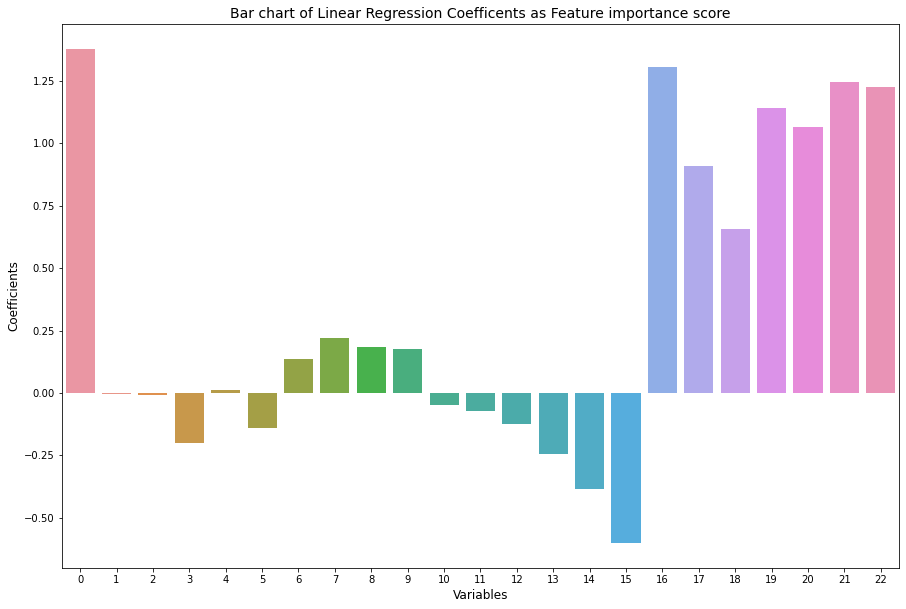

In [177]:
labels = [ 'carat' ,'depth ',' table' , 'x' , 'y' , 'z' ,'cut_good' , 'cut_ideal' , 'cut_premium' , 'cut_verygood ',  'color_E' , 'color_F', 'color_G' , 'color_H ', 'color_I' , 'color_J' , 'clarity_IF' , 'clarity_SI1' , 'clarity_SI2' , 'clarity_VS1' , 'clarity_VS2' , 'clarity_VVS1' , 'clarity_VVS2']
plt.figure(figsize=(15,10))
sns.barplot([i for i in range(len(feature_imp))], feature_imp,label = labels)

plt.title("Bar chart of Linear Regression Coefficents as Feature importance score",fontsize=14)
plt.xlabel("Variables",fontsize=12)
plt.ylabel("Coefficients",fontsize=12)
plt.show()

##### EQUATION:
* (-1.02) * Intercept + (1.38) * carat + (-0.01) * depth + (-0.01) * table + (-0.2) * x + (0.01) * y + (-0.14) * z + (0.14) * cut_good + (0.22) * cut_ideal + (0.18) * cut_premium + (0.18) * cut_verygood + (-0.05) * color_E + (-0.07) * color_F + (-0.12) * color_G + (-0.24) * color_H + (-0.39) * color_I + (-0.6) * color_J + (1.3) * clarity_IF + (0.91) * clarity_SI1 + (0.66) * clarity_SI2 + (1.14) * clarity_VS1 + (1.06) * clarity_VS2 + (1.25) * clarity_VVS1 + (1.22) * clarity_VVS2 

* All the negative coefficients will reduce the price when there is a increase in their respective variables. 

### Note:
* Since the variables are standarized we cannot directly interpret the coefficient with respect to its original units,however fair comparision can be made to identify th importance of variables.

*<u> If interpretation should be made then it can be done as follow:
- eg: Carat - If the carat(X) changes by 1 Standard deviation then the price(Y) changes by 1.38 Standard deviation of it , assuming the rest of variables remaining constant.
    * This interpretation doesnot hold true if the distribution is not normal
    
    


# <font color= blue>.................................................................................................................................

## 7.CHECKING ASSUMPTIONS OF LINEAR REGRESSION

~ Note: There are many assumptions for linear regression some of the essential assumptions are checked below for this dataset

 <font color= BLUE> <B>(1) THERE IS A LINEARITY BETWEEN X AND Y

- H0: Coefficients of all the independent variables is equal to 0; b0=b1=b2....=0
- H1: Coefficient of atleast one of the independent variables is not equal to 0

In [178]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     5499.
Date:                Mon, 13 Feb 2023   Prob (F-statistic):               0.00
Time:                        23:12:17   Log-Likelihood:                -1519.4
No. Observations:               10746   AIC:                             3087.
Df Residuals:                   10722   BIC:                             3262.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -1.0227      0.029    -35.782      0.000      -1.079      -0.967
carat            1.3778      0.014    100.623      0.000       1.351       1.405
depth           -0.0060      0.006     -1.064      0.287      -0.017       0.005
table           -0.0075      0.004     -2.112      0.035      -0.014      -0.001
x               -0.2002      0.037     -5.367      0.000      -0.273      -0.127
y                0.0107      0.008      1.381      0.167      -0.004       0.026
z               -0.1391      0.041     -3.424      0.001      -0.219      -0.059
cut_good         0.1351      0.019      7.294      0.000       0.099       0.171
cut_ideal        0.2209      0.019     11.932      0.000       0.185       0.257
cut_premium      0.1844      0.018     10.365      0.000       0.150       0.219
cut_verygood     0.1758      0.018      9.866      0.000       0.141       0.211
color_E         -0.0483      0.010     -4.860      0.000      -0.068      -0.029
color_F         -0.0712      0.010     -7.026      0.000      -0.091      -0.051
color_G         -0.1250      0.010    -12.673      0.000      -0.144      -0.106
color_H         -0.2442      0.010    -23.316      0.000      -0.265      -0.224
color_I         -0.3859      0.012    -32.616      0.000      -0.409      -0.363
color_J         -0.6014      0.015    -41.352      0.000      -0.630      -0.573
clarity_IF       1.3043      0.029     45.608      0.000       1.248       1.360
clarity_SI1      0.9094      0.025     36.776      0.000       0.861       0.958
clarity_SI2      0.6561      0.025     26.450      0.000       0.608       0.705
clarity_VS1      1.1412      0.025     45.332      0.000       1.092       1.191
clarity_VS2      1.0632      0.025     42.802      0.000       1.015       1.112
clarity_VVS1     1.2473      0.027     46.795      0.000       1.195       1.300
clarity_VVS2     1.2244      0.026     47.246      0.000       1.174       1.275
==============================================================================
Omnibus:                     3024.722   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            62151.408
Skew:                           0.847   Prob(JB):                         0.00
Kurtosis:                      14.659   Cond. No.                         50.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [179]:
# From the summary we can see,

# F-statistic:5499.
# Prob (F-statistic):0.00
    
# The F-statistic is higher and p value is lower which rejects the null hypothesis(H0)    

In [180]:
# Reset ramsey test 
reset_ramsey(lm)  # p-value of reset ramsay F test is 0 ; thus H0 is rejected

# P value is < 0.05 which rejects the null hypothesis(H0)

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=2276.401927903017, p=0.0, df_denom=1.07e+04, df_num=4>

<AxesSubplot:>

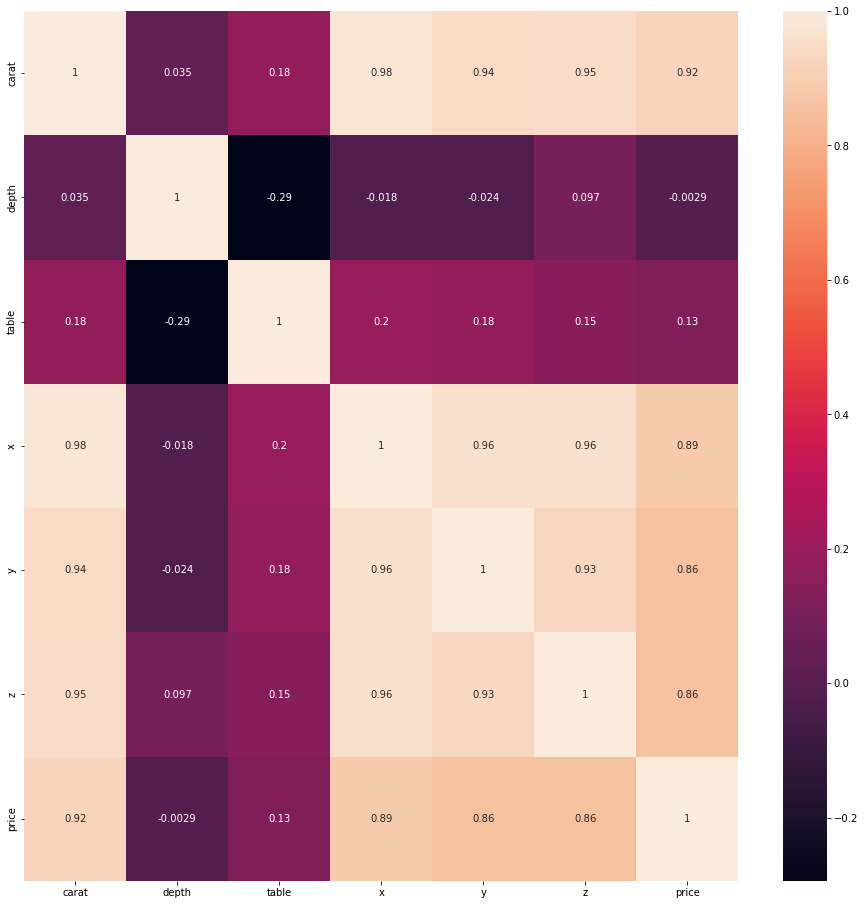

In [181]:
plt.figure(figsize=(16,16))
sns.heatmap(gem.corr(),annot=True)

# Variables carat,X,Y,Z shows strong linear relationship with price

* <B> All the test shows there are variables(X) which has correlation with the target variable(Y)

 <font color= BLUE> <B>(2) MEAN OF THE ERRORS ARE ZERO

- H0 : Mean of the errors are zero
- H1 : Mean of the errors !=0

In [182]:
np.mean(lm.resid)  

# mean=0 therefore predictions will not be symmetrically biased

5.203718424791324e-16

* <b>From the result of error's mean value we can confirm that the mean of the errors is not zero

 <font color= BLUE> <B>(3) ERRORS ARE NORMALLY DISTRIBUTED

- H0: Errors are normally distributed
- H1 : Errors are non-normally distributed

In [183]:
from scipy.stats import anderson
print(anderson(lm.resid))

# Statistic value is greater than critical value at 95% Confidence interval , so we reject null hypothesis(H0).
# Therefore errors are not normally distributed

AndersonResult(statistic=373.58684195019123, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


<AxesSubplot:ylabel='Density'>

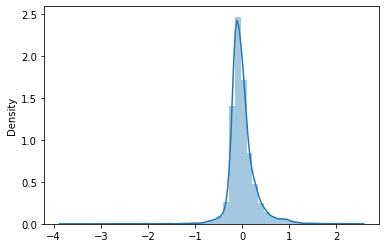

In [184]:
sns.distplot(lm.resid)

# From the dist plot we can see the distribution is skewed and not normally distributed.
# The normality seen below is because of variables scaling(Data Standardization).

In [185]:
# Shapiro test

stats.shapiro(lm.resid)

# Shapiro test too confirms p value < 0.05 which rejects null hypothesis.

ShapiroResult(statistic=0.8528749942779541, pvalue=0.0)

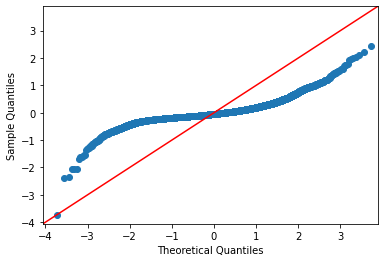

In [187]:
# QQ plot of residuals

import statsmodels.api as sm
import pylab as py


sm.qqplot(lm.resid, line ='45')
py.show() 

# Errors are not normally distributed along the 45deg line

* <b> From all the tests for normal distribution we confirm the distribution of the errors is not normal.

 <font color= BLUE> <B>(4) ERRORS ARE UNRELATED TO PREDICTOR VARIABLE 

- H0 : Covariance b/w residuals and each predictor is zero 
- H1 : Covariance b/w residuals and atleast one of the predictors is not zero 

In [188]:
resid_X=data_train.copy()
resid_X['Residuals']=lm.resid
resid_X

,carat,depth,table,x,y,z,cut_good,cut_ideal,cut_premium,cut_verygood,...,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,price,Residuals
9526,-0.435872,0.254491,-1.100279,-0.310557,-0.277950,-0.263207,0,1,0,0,...,0,0,0,0,0,0,1,0,-0.433694,-0.136826
8391,2.958730,-0.319470,1.139749,2.326481,2.230711,2.190222,0,0,1,0,...,0,0,0,1,0,0,0,0,2.509517,-0.387617
16806,0.569936,0.326236,-0.652274,0.701640,0.710050,0.740469,0,1,0,0,...,0,0,1,0,0,0,0,0,0.401114,-0.133822
14842,-0.205374,0.684962,0.691743,-0.088584,-0.054576,0.001652,0,0,0,1,...,0,0,1,0,0,0,0,0,-0.294477,-0.033274
22637,0.863297,-0.749941,-0.204268,0.994644,0.993563,0.879868,0,1,0,0,...,0,0,1,0,0,0,0,0,0.962709,0.214737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14456,3.147319,0.613216,-0.204268,2.370875,2.247893,2.385381,0,1,0,0,...,0,0,0,1,0,0,0,0,2.555011,-0.607099
10898,-0.121557,0.900197,0.243737,0.000205,0.031337,0.113172,0,0,0,1,...,0,0,0,1,0,0,0,0,-0.411569,0.017708
506,1.470973,-0.032490,2.035760,1.376437,1.294259,1.312006,0,0,1,0,...,0,0,0,0,0,0,0,0,0.587318,-0.141909
21069,-1.148319,0.039255,-0.652274,-1.473694,-1.412002,-1.420221,0,1,0,0,...,0,0,0,0,1,0,0,0,-0.830962,0.001036


In [189]:
# Covariance b/w residuals and each predictor is zero 

for col in resid_X.columns[:-1]:
    print("Covariance between residuals and",col,":",np.cov(resid_X[col],resid_X['Residuals'])[0][1]) 
    
# all are almost zero

Covariance between residuals and carat : 6.425964667053303e-16
Covariance between residuals and depth : 1.6455478725156113e-16
Covariance between residuals and table : 4.977766815666966e-16
Covariance between residuals and x : 6.172199404281838e-16
Covariance between residuals and y : 4.556202372626422e-16
Covariance between residuals and z : 5.983735300334301e-16
Covariance between residuals and cut_good : 1.461268415612962e-17
Covariance between residuals and cut_ideal : -3.2421198759132774e-16
Covariance between residuals and cut_premium : 2.0028444029161504e-16
Covariance between residuals and cut_verygood : 5.616726255804887e-17
Covariance between residuals and color_E : -3.372515544324347e-17
Covariance between residuals and color_F : 8.86318576569064e-17
Covariance between residuals and color_G : -1.2568406581238162e-16
Covariance between residuals and color_H : -1.0142344541387192e-16
Covariance between residuals and color_I : 6.896918277685361e-17
Covariance between residuals 

<font color= BLUE> <B>(5) NO AUTOCORRELATION BETWEEN THE ERRORS


- H0: There exists no first order autocorrelation between errors.
- H1: First order autocorrelation between errors exists

In [190]:
# Durbin-Watson Test 
from statsmodels.stats.stattools import durbin_watson
durbin_watson(lm.resid)

2.0211440989358476

* <b> Durbin watson result comes out to be close to <i>2</i> . Hence there is no autocorrelation exists between the errors

<font color= BLUE> <B>(6) VARIANCE OF THE ERRORS ARE CONSTANT

- H0: Error variances are consistent over the range i.e <I>Homoskedastic</I> 
- H1: Residuals are not distributed with equal variance i.e <I>Heteroskedastic</I> 

In [191]:
# Breusch-Pagan Test

from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.compat import lzip
 
result = het_breuschpagan(lm.resid,lm.model.exog) 
names = ['Lagrange multiplier statistic', 'p-value','f-statistic', 'f_pvalue']  
 
lzip(names,result)

[('Lagrange multiplier statistic', 2232.36290067701),
 ('p-value', 0.0),
 ('f-statistic', 122.23557765040825),
 ('f_pvalue', 0.0)]

In [192]:
from statsmodels.stats.diagnostic import het_white

#perform White's test
white_test = het_white(lm.resid,  lm.model.exog)

#define labels to use for output of White's test
labels = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']

#print results of White's test
print(dict(zip(labels, white_test)))

{'Test Statistic': 6945.1787640908415, 'Test Statistic p-value': 0.0, 'F-Statistic': 79.9817311272494, 'F-Test p-value': 0.0}


* <b> (P values < 0.05, in the above tests) therefore,we do not have sufficient evidence to say that heteroscedasticity is present in the regression model

<font color= BLUE> <B>(7) NO MULTICOLLINEARITY

- H0: There is little or no multicollinearity among the independent variables
- H1: There exists multicollinearity among the independent variables

In [193]:
data_train = data_train.drop("price",axis=1)
vif=pd.DataFrame()
vif['features']=data_train.columns
vif['VIF']=[variance_inflation_factor(data_train,i) for i in range(len(data_train.columns))]
vif

,features,VIF
0,carat,25.688430
1,depth,4.357694
2,table,1.706620
3,x,191.401364
4,y,9.210970
5,z,214.075855
6,cut_good,3.591817
7,cut_ideal,14.503373
8,cut_premium,8.824489
9,cut_verygood,7.662720


* <b> Most of variables have strong multicollinearity


# <font color= blue>.................................................................................................................................

## 8.BUSINESS RECOMMENDATIONS

* The 5 most significant attributes that majorly influences the price of cubic zirconia are carat, clarity_I1, cut_Ideal,color_D and the dimensions
* For a better profitability, it is recommended that the company should sell more of cubic zirconias which are having higher carats with an ideal cut quality, IF clarity and color D
* Its also recommended that the company should sell less cubic zirconias which are having higher depth, higher table, fair cut, color J and I1 clarity


# <font color= blue>.................................................................................................................................

## 9. PREDICTION USING OTHER MODELS

### <font color= BLUE> <b>(1).KNN MODEL

### 25-NN model

###### <u>TRAINING THE MODEL with 5nn 

In [194]:
#metric = minkowski is the generalised form to calculate distance in which p=2 represents Eucliden distance
classifier1= KNeighborsRegressor(n_neighbors=25, metric='minkowski', p=2 ) 
#fitting model to data
classifier1.fit(X_train, y_train) 

KNeighborsRegressor(n_neighbors=25)

##### <U> MODEL VALIDATION

In [195]:
#Prediction on validation data using 5NN model
y_pred1= classifier1.predict(X_valid) 

In [196]:
#Error metrics
T6_MAE_V = np.mean(np.abs(y_valid-y_pred1))
T6_MSE_V = np.mean((y_valid -y_pred1)**2)
T6_RMSE_V =np.sqrt(np.mean((y_valid-y_pred1)**2))
T6_MAPE_V = np.mean(np.abs(y_valid-y_pred1)/y_valid)*100

##### <U> MODEL TESTING

In [197]:
#Prediction on validation data using 5NN model
y_pred2= classifier1.predict(X_test) 

In [198]:
#Bringing back to original scale_ test data

test_standardized = y_test1

mean = 3936.51
std = 4062.47
test_original = test_standardized * std + mean

#print("y_values (standardized scale): ", test_standardized)
#print("y_values (original scale): ", test_original)


In [199]:
#Bringing back predicted value to original scale

test_predicted_standardized = y_pred2
mean = 3936.51
std = 4062.47
predicted = test_predicted_standardized * std + mean

#print("Predicted values (standardized scale): ", test_predicted_standardized)
#print("Predicted values (original scale): ", predicted)

In [200]:
#Error metrics
T6_MAE_T = np.mean(np.abs(test_original-predicted))
T6_MSE_T = np.mean((test_original-predicted)**2)
T6_RMSE_T =np.sqrt(np.mean((test_original-predicted)**2))
T6_MAPE_T = np.mean(np.abs(test_original-predicted)/test_original)*100

### 50-NN model

###### <u>TRAINING THE MODEL with 10nn 

In [201]:
#metric = minkowski is the generalised form to calculate distance in which p=2 represents Eucliden distance
classifier2= KNeighborsRegressor(n_neighbors=50, metric='minkowski', p=2 ) 
#fitting model to data
classifier2.fit(X_train, y_train) 

KNeighborsRegressor(n_neighbors=50)

##### <U> MODEL VALIDATION

In [202]:
#Prediction on validation data using 5NN model
y_pred1= classifier2.predict(X_valid) 

In [203]:
#Error metrics
T7_MAE_V = np.mean(np.abs(y_valid-y_pred1))
T7_MSE_V = np.mean((y_valid -y_pred1)**2)
T7_RMSE_V =np.sqrt(np.mean((y_valid-y_pred1)**2))
T7_MAPE_V = np.mean(np.abs(y_valid-y_pred1)/y_valid)*100

##### <U> MODEL TESTING

In [204]:
#Prediction on validation data using 5NN model
y_pred2= classifier2.predict(X_test) 

In [205]:
#Bringing back to original scale_ test data

test_standardized = y_test1

mean = 3936.51
std = 4062.47
test_original = test_standardized * std + mean

#print("y_values (standardized scale): ", test_standardized)
#print("y_values (original scale): ", test_original)


In [206]:
#Bringing back predicted value to original scale

test_predicted_standardized = y_pred2
mean = 3936.51
std = 4062.47
predicted = test_predicted_standardized * std + mean

#print("Predicted values (standardized scale): ", test_predicted_standardized)
#print("Predicted values (original scale): ", predicted)

In [207]:
#Error metrics
T7_MAE_T = np.mean(np.abs(test_original-predicted))
T7_MSE_T = np.mean((test_original -predicted)**2)
T7_RMSE_T =np.sqrt(np.mean((test_original-predicted)**2))
T7_MAPE_T = np.mean(np.abs(test_original-predicted)/test_original)*100

#### FINAL TEST RESULT - KNN Models

In [210]:
i = ["25NN","50NN"]
test_result2 = pd.DataFrame({
                       "MAE":[T6_MAE_T,T7_MAE_T],
                       "MSE":[T6_MSE_T,T7_MSE_T],
                       "RMSE":[T6_RMSE_T,T7_RMSE_T],
                       "MAPE":[T6_MAPE_T,T7_MAPE_T]
                      },index = [i])
test_result2

#mape is not valid here since the variables are standardized.

,MAE,MSE,RMSE,MAPE
25NN,597.101312,1.236733e+06,1112.084846,17.933513
50NN,627.430368,1.349146e+06,1161.527542,19.224219


*  <b>
    <font color = green>The performance of the KNN model is closer to the linear models performance however the time and space complexity of the KNN model is high compared to Linear regression model  and also intrepretability is not possible here.

### <font color= BLUE> <b>(3).DECISION TREE MODEL

* Standardized or Unstandarized data doesnot matters for Tree based model since its Non parametrics .

### <u>Standardized data

### Fitting model with optimal parameters

In [211]:
dt1 = DecisionTreeRegressor(max_depth=15,
                            max_leaf_nodes=60,min_samples_leaf=8,min_samples_split=2)
dt1.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=15, max_leaf_nodes=60, min_samples_leaf=8)

* Since we are doing Gridsearch we will not do any validation ,we do direct testing

In [212]:
from sklearn import tree
fig,axes = plt.subplots(figsize=(50,50),dpi=300)
tree.plot_tree(dt1,feature_names = list(X),filled = True)
plt.show()
# vizualization the training of tree with optimal parameters

##### <U> MODEL TESTING

In [213]:
#Prediction on validation data using 5NN model
y_pred3= dt1.predict(X_test) 

In [214]:
#Error metrics
T8_MAE_T = np.mean(np.abs(y_test-y_pred3))
T8_MSE_T = np.mean((y_test -y_pred3)**2)
T8_RMSE_T =np.sqrt(np.mean((y_test-y_pred3)**2))
T8_MAPE_T = np.mean(np.abs(y_test-y_pred3)/y_test)*100

### <u>Unstandardized data

### Fitting model with optimal parameters

In [215]:
dt3 = DecisionTreeRegressor(max_depth=15,
                            max_leaf_nodes=70,min_samples_leaf=8,min_samples_split=2)
dt3.fit(X_train_a,y_train_a)

DecisionTreeRegressor(max_depth=15, max_leaf_nodes=70, min_samples_leaf=8)

* Since we are doing Gridsearch we will not do any validation ,we do direct testing

In [216]:
from sklearn import tree
fig,axes = plt.subplots(figsize=(50,50),dpi=300)
tree.plot_tree(dt3,feature_names = list(X),filled = True)
plt.show()
# vizualization the training of tree with optimal parameters

##### <U> MODEL TESTING

In [217]:
#Prediction on test data using DT model
y_pred4= dt3.predict(X_test_a) 

In [218]:
#Error metrics
T9_MAE_T = np.mean(np.abs(y_test_a-y_pred4))
T9_MSE_T = np.mean((y_test_a -y_pred4)**2)
T9_RMSE_T =np.sqrt(np.mean((y_test_a-y_pred4)**2))
T9_MAPE_T = np.mean(np.abs(y_test_a-y_pred4)/y_test_a)*100

In [219]:
result3 = pd.DataFrame({"MAE":[T8_MAE_T,T9_MAE_T],
                       "MSE":[T8_MSE_T,T9_MSE_T],
                      "RMSE":[T8_RMSE_T,T9_RMSE_T],
                      "MAPE":[T8_MAPE_T,T9_MAPE_T]
                      },index=["Decision tree with Optimal parameters(Standardized variables)",
                              "Decision tree with Optimal parameters(Unstandardized variables)"])
result3

,MAE,MSE,RMSE,MAPE
Decision tree with Optimal parameters(Standardized variables),0.136386,0.061857,0.248710,16.801754
Decision tree with Optimal parameters(Unstandardized variables),543.964284,985497.618314,992.722327,18.261304



# <font color= blue>.................................................................................................................................

## 10.  CONCLUSION:

* <b>
    <font color = green>From all the experiments above we can conclude that out of all models the one which gives the  clear interpretability over feature importance is linear regression model eventhough in general the decision tree is interpretable the optimal tree here is complex to interpret and the accuracy provided by all three models used here are closer however each has its own drawbacks and the LR model can be preffered for this business problem.

                                                    ~ The End ~